# Parcial ML 
# Jose Montalvo

In [2]:
# Importar librerias necesarias
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

Datos principales para la lectura del parcial

In [3]:
#df_test = pd.read_csv('C:/Users/a843931/OneDrive - Yara International ASA/Documents/Maestria analisis de dato/Parcial #1/Parcial ML maestria de datos/data_teste_dv_df_2011.csv')
df_traing_wind = pd.read_csv('C:/Users/a843931/OneDrive - Yara International ASA/Documents/Maestria analisis de dato/Parcial #1/Parcial ML maestria de datos/data_treino_dv_df_2000_2010.csv')

In [4]:
df_traing_trans = pd.read_csv('C:/Users/a843931/OneDrive - Yara International ASA/Documents/Maestria analisis de dato/Parcial #1/Parcial ML maestria de datos/train_transaction.csv')
df_traing_iden = pd.read_csv('C:/Users/a843931/OneDrive - Yara International ASA/Documents/Maestria analisis de dato/Parcial #1/Parcial ML maestria de datos/train_identity.csv')

In [4]:
df_traing_trans.head

<bound method NDFrame.head of         TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  \
0             2987000        0          86400           68.50         W   
1             2987001        0          86401           29.00         W   
2             2987002        0          86469           59.00         W   
3             2987003        0          86499           50.00         W   
4             2987004        0          86506           50.00         H   
...               ...      ...            ...             ...       ...   
590535        3577535        0       15811047           49.00         W   
590536        3577536        0       15811049           39.50         W   
590537        3577537        0       15811079           30.95         W   
590538        3577538        0       15811088          117.00         W   
590539        3577539        0       15811131          279.95         W   

        card1  card2  card3       card4  card5  ... V330  V331  V332 

In [7]:
df_traing_wind.head(5)

,HORA (UTC),"VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))","VENTO, VELOCIDADE HORARIA (m/s)",UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C),TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C),"UMIDADE RELATIVA DO AR, HORARIA (%)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)","PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)","VENTO, RAJADA MAXIMA (m/s)",PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)
0,12:00,0.809017,1.8,69.0,60.0,22.6,20.7,61.0,888.2,0.0,3.8,888.2,887.7
1,13:00,0.965926,2.7,62.0,55.0,24.2,22.5,55.0,888.4,0.0,4.7,888.4,888.2
2,14:00,0.891007,2.0,56.0,50.0,25.5,24.3,51.0,888.1,0.0,4.9,888.4,888.1
3,15:00,0.848048,2.5,52.0,44.0,27.4,25.0,44.0,887.4,0.0,5.8,888.1,887.4
4,16:00,0.224951,2.4,50.0,43.0,27.1,25.5,46.0,886.5,0.0,5.8,887.4,886.5


In [8]:
df_traing_wind.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87693 entries, 0 to 87692
Data columns (total 13 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   HORA (UTC)                                             87693 non-null  object 
 1   VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))             87693 non-null  float64
 2   VENTO, VELOCIDADE HORARIA (m/s)                        87693 non-null  float64
 3   UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)               87693 non-null  float64
 4   UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)               87693 non-null  float64
 5   TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)         87693 non-null  float64
 6   TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)         87693 non-null  float64
 7   UMIDADE RELATIVA DO AR, HORARIA (%)                    87693 non-null  float64
 8   PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORAR

Renombres de algunas columas para los datos de Wind speed

In [5]:
df_traing_wind.rename(columns={
            'VIENTO, DIRECCION HORARIA':'DIRECCION VIENTO POR HORA',
            'VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))':'DIRECCION DEL VIENTE HORARIA',
            'VENTO, VELOCIDADE HORARIA (m/s)':'VEL_VIENTO',
            'TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)':'TEMPERATURA MAX POR HORA',
            'TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)':'TEMPERATURA MIN POR HORA',
            'PRECIPITAÃ¯Â¿Â½Ã¯Â¿Â½O TOTAL, HORÃ¯Â¿Â½RIO (mm)':'PRECIPITACION TOTAL POR HORA',
            'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO':'PRES ATM DE ESTACION',
            'PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)':'PRECIPITACION TOTAL POR HORA',
            'PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)':'PESS ATM MAX POR HORA',
            'PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)':'PRESS ATM MIN POR HORA'
            },inplace=True)

In [10]:
df_traing_trans.columns

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5',
       ...
       'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338',
       'V339'],
      dtype='object', length=394)

#Analisis exploratorio de los datos de Wind speed

In [11]:
df_traing_wind.describe().T

,count,mean,std,min,25%,50%,75%,max
DIRECCION DEL VIENTE HORARIA,87693.0,0.405810,0.686247,-1.0,-0.156434,0.788011,0.970296,1.0
VEL_VIENTO,87693.0,2.466192,1.313968,0.0,1.500000,2.400000,3.400000,10.0
UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),87693.0,69.058465,19.640222,12.0,54.000000,72.000000,87.000000,100.0
UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),87693.0,63.176194,20.166336,10.0,48.000000,64.000000,80.000000,98.0
TEMPERATURA MAX POR HORA,87693.0,21.921264,3.721386,9.2,19.200000,21.400000,24.700000,35.3
TEMPERATURA MIN POR HORA,87693.0,20.684570,3.513744,8.4,18.400000,20.200000,23.100000,34.4
"UMIDADE RELATIVA DO AR, HORARIA (%)",87693.0,66.146682,19.992327,10.0,51.000000,68.000000,84.000000,99.0
"PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",87693.0,887.251925,4.012404,863.4,885.300000,887.200000,889.100000,1023.5
PRECIPITACION TOTAL POR HORA,87693.0,0.160907,1.307515,0.0,0.000000,0.000000,0.000000,70.8
"VENTO, RAJADA MAXIMA (m/s)",87693.0,5.161076,2.311157,0.0,3.400000,5.000000,6.800000,24.3


Dare un resumen de la interpretacion que se puede obtener la informacion suministrada de la tabla wind speed referente a la columna DIRECCION DEL VIENTE HORARIA
- count: Este valor indica la cantidad de observaciones o datos que se tienen para la variable "DIRECCION DEL VIENTE HORARIA". En este caso, hay 87,693 observaciones disponibles para esta variable.

- mean: La media (o promedio) de la variable. En este caso, la media es aproximadamente 0.405810.

- std: La desviación estándar de la variable, que mide la dispersión de los datos. En este caso, la desviación estándar es aproximadamente 0.686247.

- min: El valor mínimo observado en la variable. Aquí, el valor mínimo es -1.0.

- 25%: El percentil 25 o el primer cuartil. Indica el valor por debajo del cual se encuentra el 25% de las observaciones. En este caso, el valor del primer cuartil es aproximadamente -0.156434.

- 50%: El percentil 50 o la mediana. Representa el valor que separa la mitad inferior y superior de las observaciones cuando están ordenadas. En este caso, la mediana es aproximadamente 0.788011.

- 75%: El percentil 75 o el tercer cuartil. Indica el valor por debajo del cual se encuentra el 75% de las observaciones. Aquí, el valor del tercer cuartil es aproximadamente 0.970296.

- max: El valor máximo observado en la variable. En este caso, el valor máximo es 1.0.

Estas estadísticas resumen la distribución de la variable "DIRECCION DEL VIENTO HORARIA" y proporcionan información sobre su tendencia central, dispersión y valores extremos. 
Por ejemplo, podemos ver que la media es positiva, lo que sugiere una tendencia general hacia valores positivos en esta variable. También puedes observar que los valores oscilan entre -1.0 y 1.0.

Column:  DIRECCION DEL VIENTE HORARIA
Skew: -0.86
Kurtosis:  -0.82


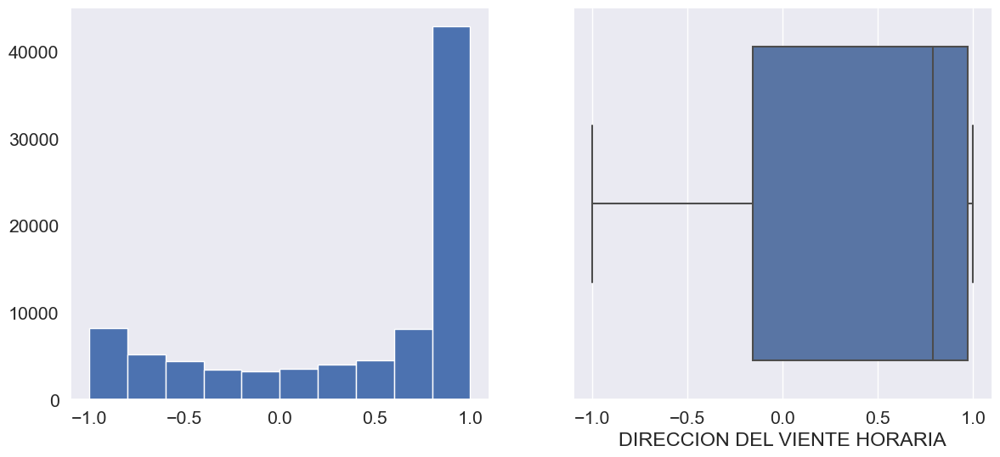

Column:  VEL_VIENTO
Skew: 0.37
Kurtosis:  -0.11


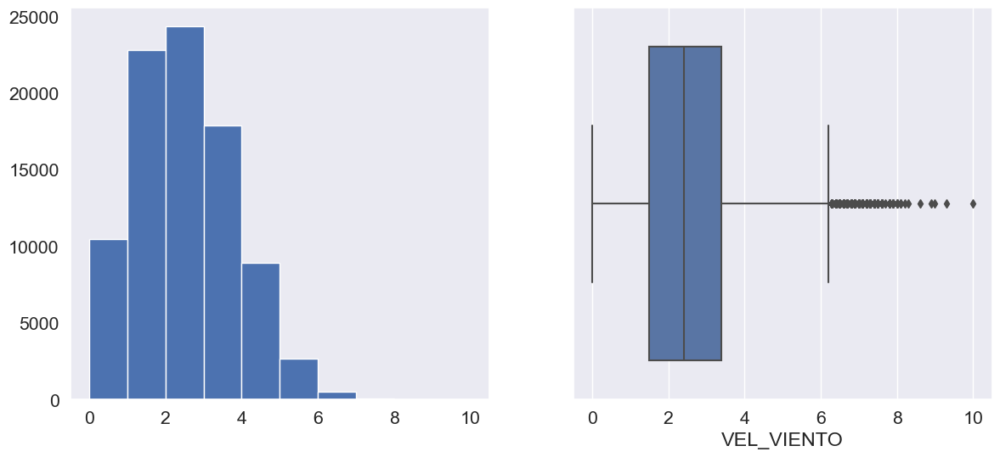

Column:  UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)
Skew: -0.48
Kurtosis:  -0.78


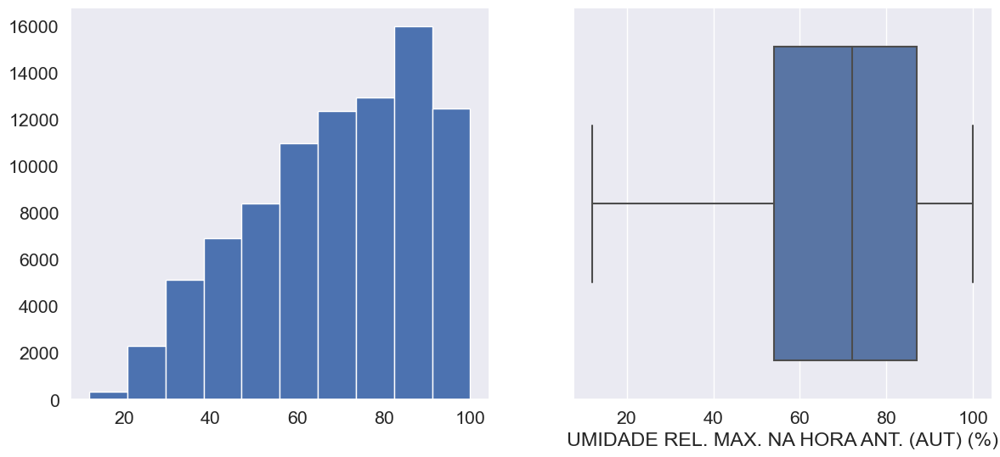

Column:  UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)
Skew: -0.23
Kurtosis:  -0.96


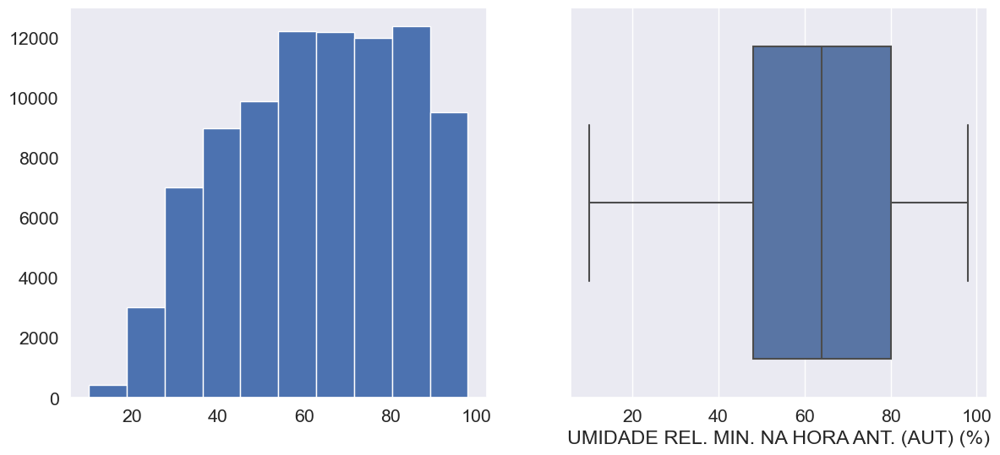

Column:  TEMPERATURA MAX POR HORA
Skew: 0.26
Kurtosis:  -0.42


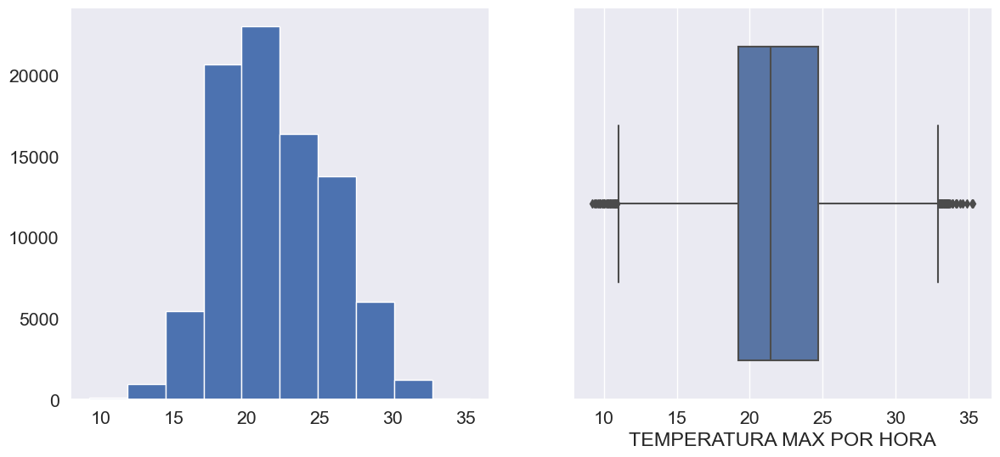

Column:  TEMPERATURA MIN POR HORA
Skew: 0.24
Kurtosis:  -0.12


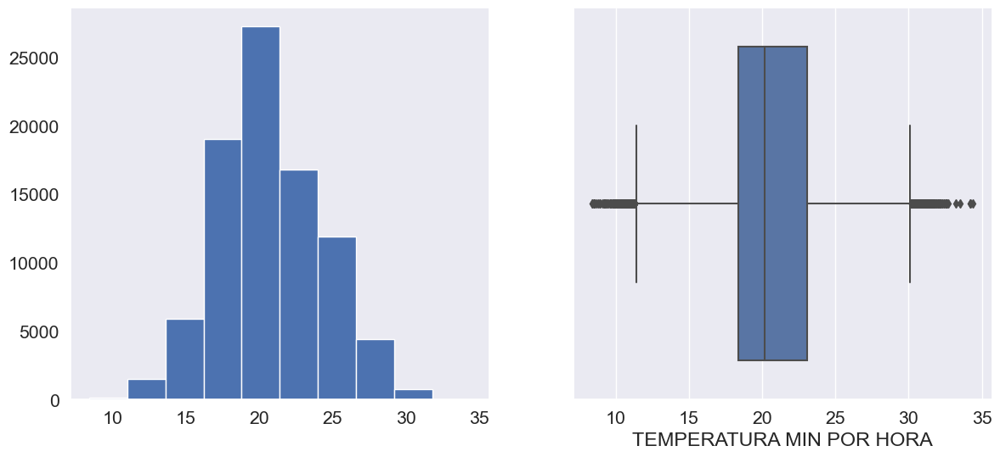

Column:  UMIDADE RELATIVA DO AR, HORARIA (%)
Skew: -0.35
Kurtosis:  -0.89


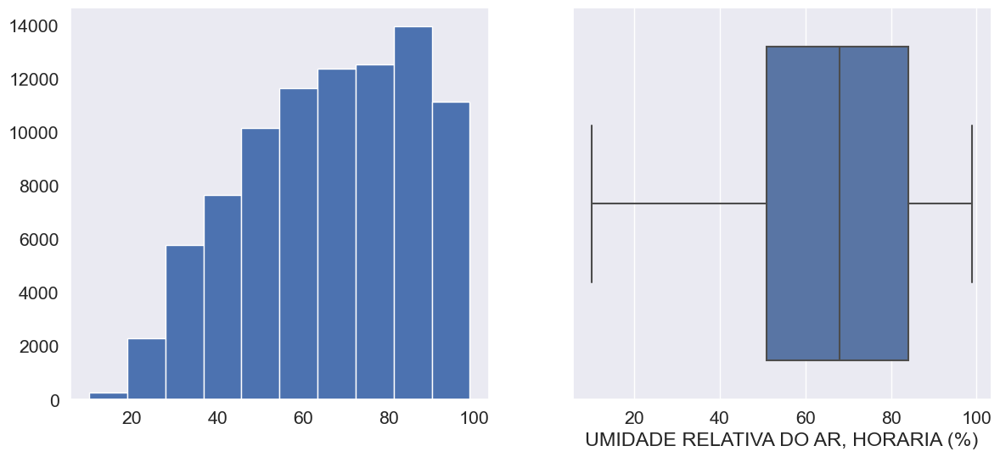

Column:  PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)
Skew: 6.18
Kurtosis:  179.64


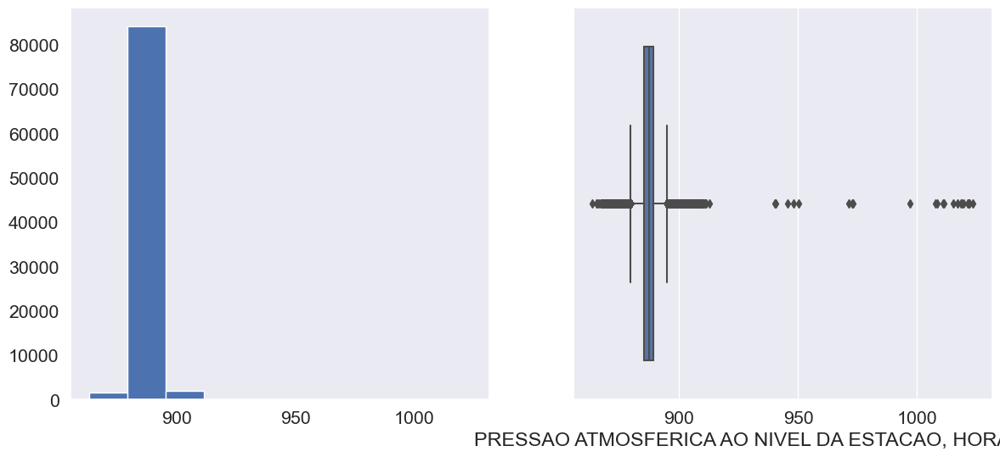

Column:  PRECIPITACION TOTAL POR HORA
Skew: 17.65
Kurtosis:  476.4


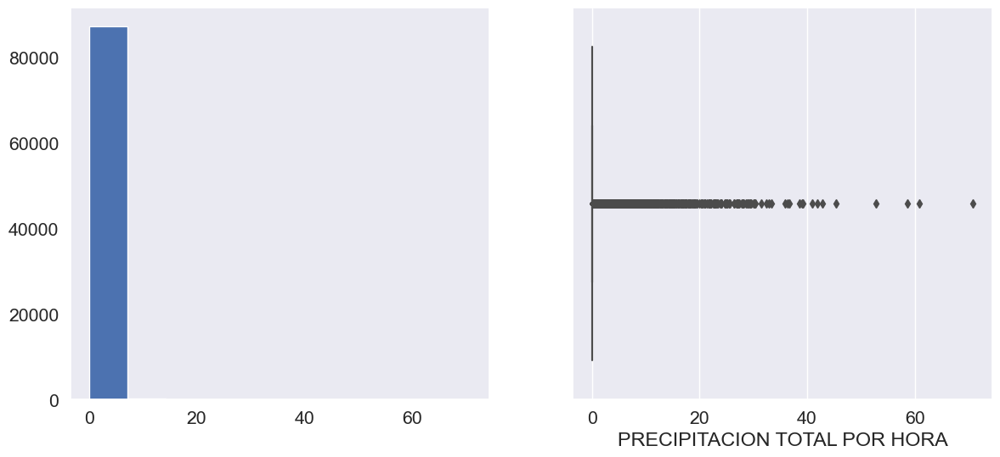

Column:  VENTO, RAJADA MAXIMA (m/s)
Skew: 0.41
Kurtosis:  0.11


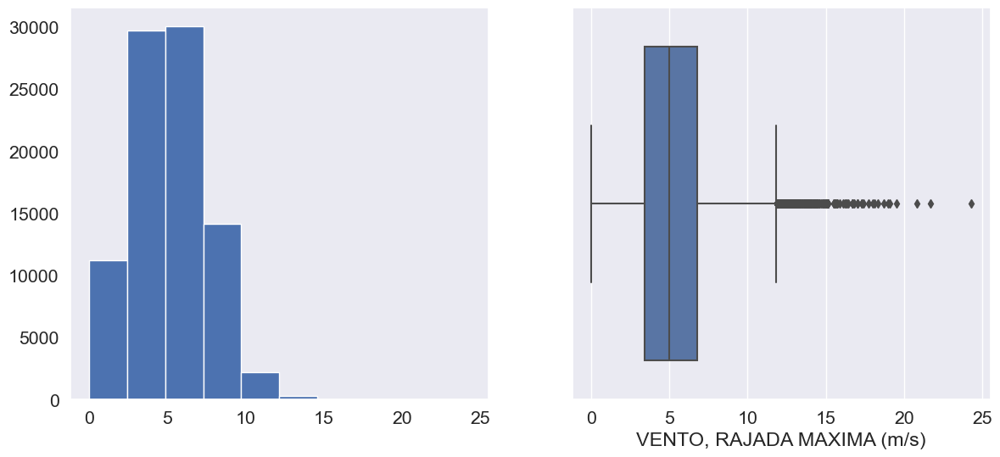

Column:  PESS ATM MAX POR HORA
Skew: 1.02
Kurtosis:  5.82


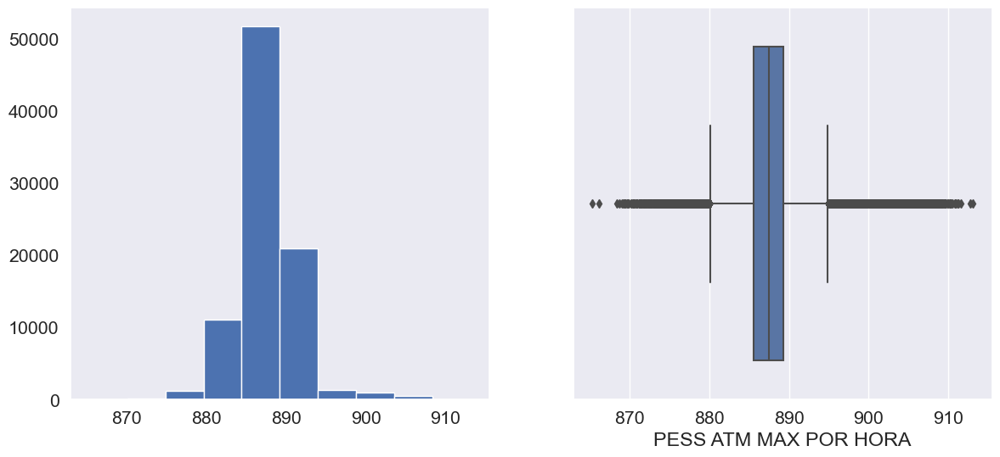

Column:  PRESS ATM MIN POR HORA
Skew: 0.33
Kurtosis:  4.91


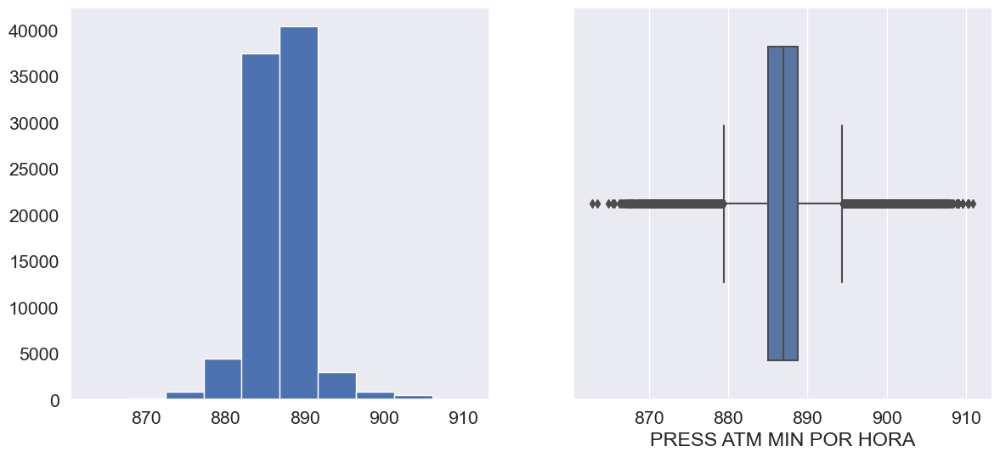

In [12]:
cat_cols=df_traing_wind.select_dtypes(include=['object']).columns
num_cols = df_traing_wind.select_dtypes(include=np.number).columns.tolist()

sns.set(font_scale=1.4)
for col in num_cols:
    print('Column: ', col)
    print('Skew:', round(df_traing_wind[col].skew(), 2))
    print('Kurtosis: ', round(df_traing_wind[col].kurtosis(), 2))
    plt.figure(figsize = (14, 6))
    plt.subplot(1, 2, 1)
    df_traing_wind[col].hist(grid=False)
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_traing_wind[col])
    plt.show()

con la interpretacion que nos brinda los ostograma son las frecuencia en que se encuentran los valores de las columnas, y el diagrama de caja es clave para los conjuntos de datos. 
Los "bigotes" que se extienden desde el cuadro indican la variabilidad de los datos más allá del rango intercuartílico. Los valores atípicos se muestran como puntos individuales más allá de los bigotes.

Esto quiere decir:

Histograma de Velocidad del Viento (0 a 4):

* El histograma representa con qué frecuencia se observan velocidades del viento en el rango de 0 a 4 metros por segundo.
* Muestra cuántas horas experimentan ciertos niveles de velocidad del viento en ese intervalo.

Diagrama de Caja de Velocidad del Viento (Sesgado hacia la Izquierda):

* El diagrama de caja resalta las estadísticas principales de las velocidades del viento en el rango de 0 a 4 metros por segundo.
* La distribución sesgada hacia la izquierda sugiere que la mayoría de las observaciones de velocidad del viento están en el extremo más bajo del rango.
* La mediana se encuentra en el lado izquierdo de la caja, indicando una tendencia hacia velocidades del viento más bajas.

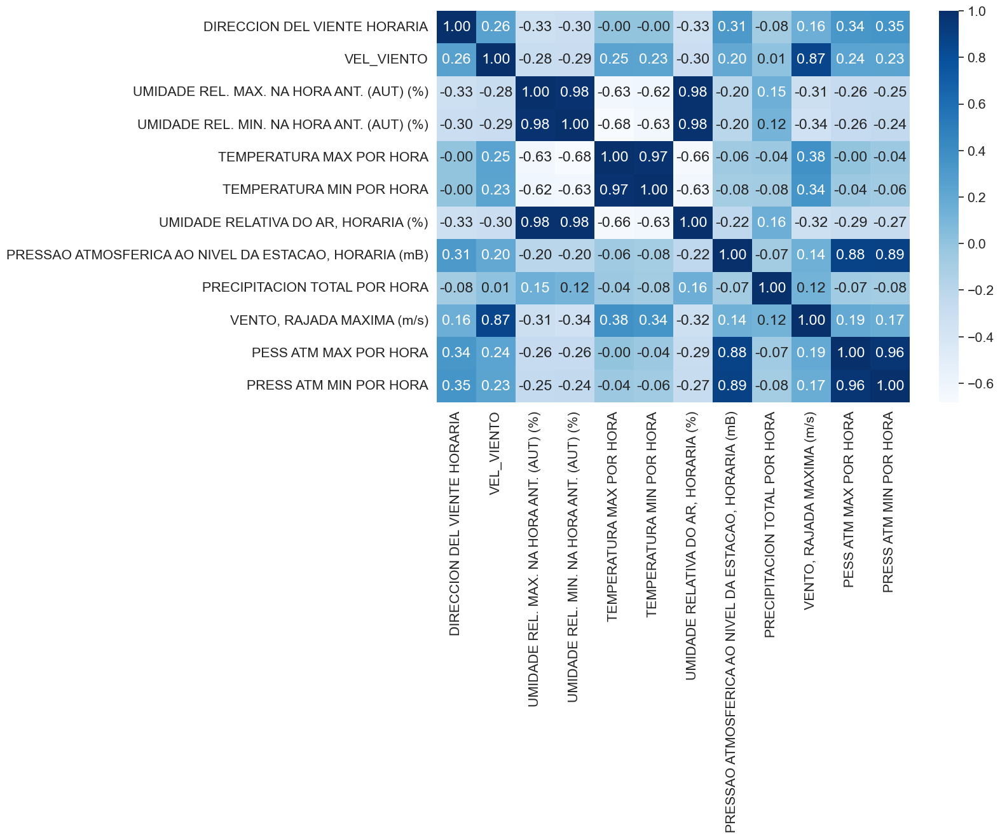

In [13]:
correlation_matrix = df_traing_wind.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f") 

plt.show()

Gracias a la matriz de correlacion podemos identificar cuales columnas estan correlacionadas entre si, como afectan las unas con las otras, asi nos ayudaremos a identiricar con que columas se nos haria mas util trabajar.

In [18]:
df_traing_wind.columns

Index(['HORA (UTC)', 'DIRECCION DEL VIENTE HORARIA', 'VEL_VIENTO',
       'UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)',
       'UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)', 'TEMPERATURA MAX POR HORA',
       'TEMPERATURA MIN POR HORA', 'UMIDADE RELATIVA DO AR, HORARIA (%)',
       'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)',
       'PRECIPITACION TOTAL POR HORA', 'VENTO, RAJADA MAXIMA (m/s)',
       'PESS ATM MAX POR HORA', 'PRESS ATM MIN POR HORA'],
      dtype='object')

<Axes: xlabel='VEL_VIENTO', ylabel='VENTO, RAJADA MAXIMA (m/s)'>

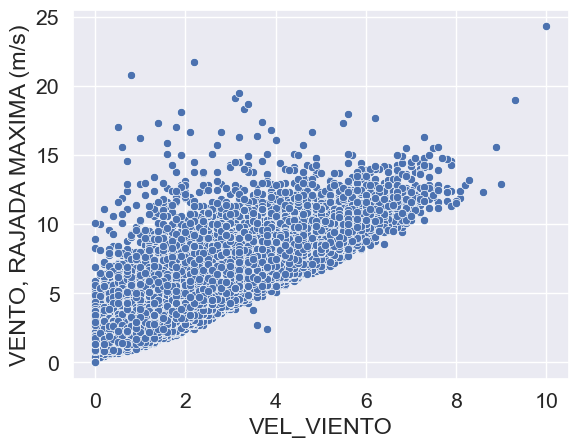

In [19]:
sns.scatterplot(data=df_traing_wind, x="VEL_VIENTO", y="VENTO, RAJADA MAXIMA (m/s)")

Podemos identificar por medio de la matriz de correlacion cuales son esas variales que estan altamente correlacionasas entre si , esto quiere decir que para este grafico son directamente proporcial una con la otra.
si una aumente la otra tambien como se evidencia en la grafica.

<Axes: xlabel='UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)', ylabel='TEMPERATURA MAX POR HORA'>

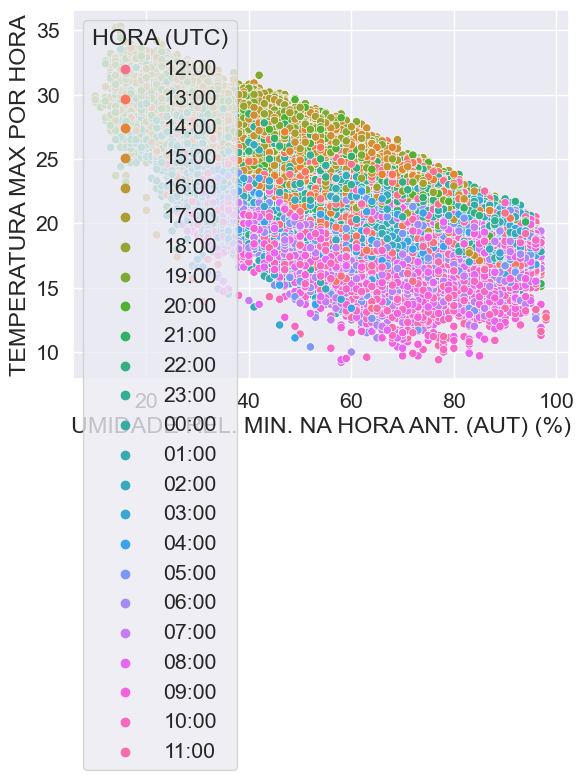

In [16]:
sns.scatterplot(data=df_traing_wind, x="UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)",y="TEMPERATURA MAX POR HORA",hue="HORA (UTC)")


Por medio grafico podemos identificar que para estas dos columnas son invernsamente proporcinal entre ellas, indicando si una de ella aumenta la otra se vera afectada en sentido a la direccion de la columna anterior.
es decir al disminuir la tempreratura max , la humedad aumentara, y viseversa

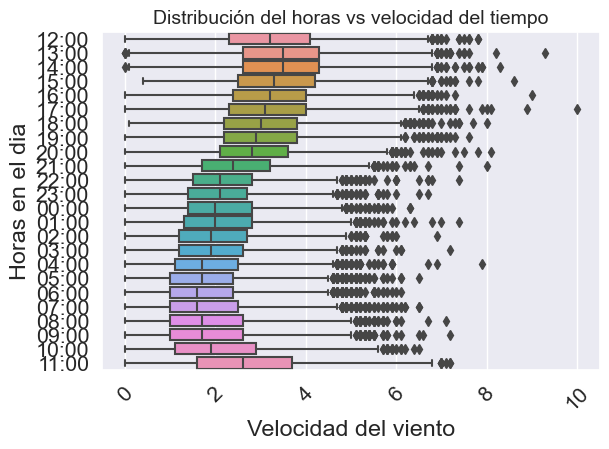

In [20]:
sns.boxplot(data=df_traing_wind, x="VEL_VIENTO", y="HORA (UTC)" )
plt.title('Distribución del horas vs velocidad del tiempo', fontsize=14)
plt.xlabel('Velocidad del viento')
plt.ylabel('Horas en el dia')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

Por medio del grafico de caja podemos identificar que el las velocidades con mayor registro son entre 1 y 4 anotanos en el transcurso del dia. 
Tambien nos ayuda a identficar los valores atipicos registrados en las horas registradas, son velocidades que no son muy frecuentes en las horas registradas.

Haremos varios graficos generalizando los resultado

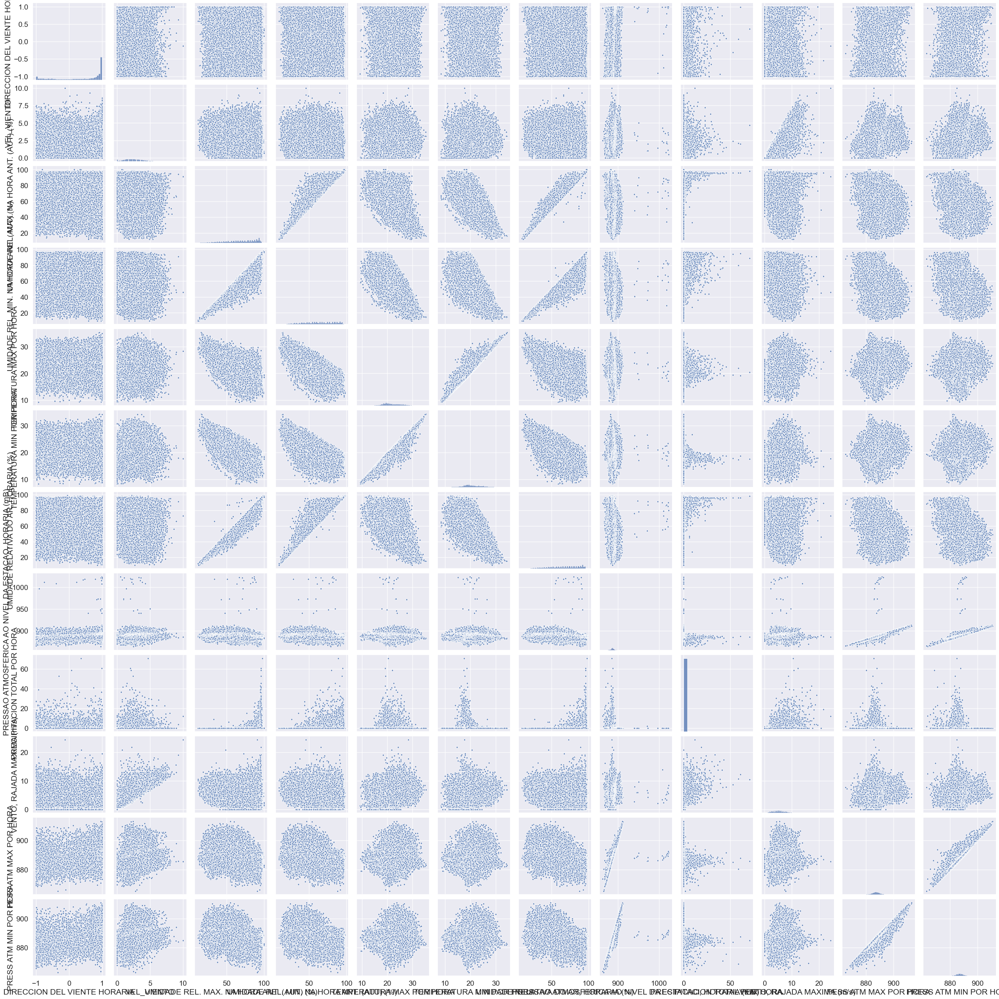

In [ ]:
import seaborn as sns
sns.pairplot(df_traing_wind, markers='*')

merge entre tablas

In [6]:
import pandas as pd

In [7]:
df_merge = pd.merge(df_traing_trans , df_traing_iden,on = "TransactionID" , how="left")

Ejercicio # 5

In [6]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.impute import SimpleImputer
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score
from sklearn.pipeline import Pipeline


Selecionamos los valores numericos para la clasificiacion de los modelos

In [7]:
# se realizo una limpieza de los valores con un lumbrar menos a 80% de nulos
porcentaje_nulos = (df_traing_trans.isnull().sum() / len(df_traing_iden)) * 100

columnas_a_eliminar = porcentaje_nulos[porcentaje_nulos > 50].index

df_traing_trans_sin_null = df_traing_trans.drop(columns=columnas_a_eliminar)

In [8]:
#Eliminar valores null para un mejor procesamiento
df_trans_limpio =df_traing_trans_sin_null.dropna()

In [9]:
#se trabaja con valores numericos
df_merge_numerico = df_trans_limpio.select_dtypes(include=['number'])
#df_merge_numerico = df_merge_numerico.dropna()

## Filtrar 50.000 lineas por rendimiento. llevaba aprox 20 min por modelo

In [12]:
num_filas_a_filtrar = 20000
df_filtrado = df_merge_numerico.head(num_filas_a_filtrar)

In [16]:
x = df_merge_numerico.drop('isFraud', axis=1)
y = df_merge_numerico['isFraud']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [13]:
x = df_filtrado.drop('isFraud', axis=1)
y = df_filtrado['isFraud']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [14]:
from sklearn.neighbors import KNeighborsClassifier
# Inicializar el clasificador K-NN
clf = KNeighborsClassifier()

# Crear un pipeline con escalado de características
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Escalar características
    ('classifier', clf)  
])

# Definimos los hiperparámetros a ajustar en GridSearchCV para K-NN
param_grid = {
    'classifier__n_neighbors': [3, 5, 7],   # Hiperparámetro del K-NN
    'classifier__weights': ['uniform', 'distance']
}

# Configurar GridSearchCV con validación cruzada
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Ajustar el modelo
grid.fit(X_train, y_train)

# Obtener las mejores métricas y el mejor modelo
best_clf = grid.best_estimator_
y_pred = best_clf.predict(X_test)
y_pred_prob = best_clf.predict_proba(X_test)[:, 1]

#Calcular matriz de confuion
confusion = confusion_matrix(y_test,y_pred)

# Métricas de rendimiento
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
auc_score_KNN = roc_auc_score(y_test, y_pred_prob)

# Imprimir las métricas
print("Matriz de Confusión:")
print(confusion)
print("Mejor Modelo K-NN")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc_score_KNN}")


Matriz de Confusión:
[[3900    2]
 [  88   10]]
Mejor Modelo K-NN
Precisión: 0.8333333333333334
Recall: 0.10204081632653061
F1-Score: 0.18181818181818182
AUC: 0.6558149143819495


#Para el modelo de Ridge no se puede utilizar estos parametros ya que la columna de fraude es binario por tal motivo no se puede predecir valores numéricos continuos en función de características numéricas

In [15]:
from sklearn.linear_model import LogisticRegression

# Inicializar el clasificador Regresión Logística
clf = LogisticRegression()

# Crear un pipeline con escalado de características
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Escalar características
    ('classifier', clf)  # Clasificador Regresión Logística
])

# Definir los hiperparámetros a ajustar en GridSearchCV para Regresión Logística
param_grid = {
    'classifier__C': [0.001, 0.01, 0.1, 1.0],  # Parámetro de regularización C
}

# Configurar GridSearchCV con validación cruzada
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Ajustar el modelo
grid.fit(X_train, y_train)

# Obtener las mejores métricas y el mejor modelo
best_clf = grid.best_estimator_
y_pred = best_clf.predict(X_test)
y_pred_prob = best_clf.predict_proba(X_test)[:, 1]

#Calcular matriz de confuion
confusion = confusion_matrix(y_test,y_pred)

# Métricas de rendimiento
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
auc_score_Lasso = roc_auc_score(y_test, y_pred_prob)

# Imprimir las métricas
print("Matriz de Confusión:")
print(confusion)
print("Mejor Modelo Regresión Logística")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc_score_Lasso}")



Matriz de Confusión:
[[3899    3]
 [  97    1]]
Mejor Modelo Regresión Logística
Precisión: 0.25
Recall: 0.01020408163265306
F1-Score: 0.019607843137254898
AUC: 0.7051642799610874


In [16]:
from sklearn.naive_bayes import GaussianNB

# Inicializar el clasificador Bayes
clf = GaussianNB()

# Crear un pipeline con escalado de características
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Escalar características
    ('classifier', clf)  # Clasificador Naive Bayes
])

# (No se ajustan hiperparámetros en Naive Bayes por defecto)
param_grid = {
    # no hay hiperparámetros específicos para ajustar en GaussianNB (Naive Bayes Gaussiano) es que este algoritmo de clasificación 
    # no tiene parámetros que se puedan optimizar de la misma manera que otros algoritmos, como K-Nearest Neighbors (K-NN) o Support Vector Machine (SVM).
}

# Configurar GridSearchCV con validación cruzada
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Ajustar el modelo
grid.fit(X_train, y_train)

# Obtener las mejores métricas y el mejor modelo
best_clf = grid.best_estimator_
y_pred = best_clf.predict(X_test)
y_pred_prob = best_clf.predict_proba(X_test)[:, 1]

#Calcular matriz de confuion
confusion = confusion_matrix(y_test,y_pred)

# Métricas de rendimiento
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
auc_score_Bayes = roc_auc_score(y_test, y_pred_prob)

# Imprimir las métricas
print("Matriz de Confusión:")
print(confusion)
print("Mejor Modelo Naive Bayes")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc_score_Bayes}")


Matriz de Confusión:
[[3539  363]
 [  74   24]]
Mejor Modelo Naive Bayes
Precisión: 0.06201550387596899
Recall: 0.24489795918367346
F1-Score: 0.09896907216494845
AUC: 0.6814558729693825


In [17]:
import xgboost as xgb

# Inicializar el clasificador XGBoost (XGBClassifier)
clf = xgb.XGBClassifier()

# Crear un pipeline con escalado de características
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Escalar características
    ('classifier', clf)  # Clasificador XGBoost
])

# Definir los hiperparámetros a ajustar en GridSearchCV para XGBoost
param_grid = {
    'classifier__n_estimators': [100, 200, 300],  # Número de árboles (estimadores)
    'classifier__learning_rate': [0.01, 0.1, 0.2],  # Tasa de aprendizaje
}

# Configurar GridSearchCV con validación cruzada
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Ajustar el modelo
grid.fit(X_train, y_train)

# Obtener las mejores métricas y el mejor modelo
best_clf = grid.best_estimator_
y_pred = best_clf.predict(X_test)
y_pred_prob = best_clf.predict_proba(X_test)[:, 1]

#Calcular matrix de confusion
confusion = confusion_matrix(y_test,y_pred)

# Métricas de rendimiento
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
auc_score_XGBoost = roc_auc_score(y_test, y_pred_prob)

# Imprimir las métricas
print("Matriz de Confusión:")
print(confusion)
print("Mejor Modelo XGBoost")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc_score_XGBoost}")


Matriz de Confusión:
[[3901    1]
 [  71   27]]
Mejor Modelo XGBoost
Precisión: 0.9642857142857143
Recall: 0.2755102040816326
F1-Score: 0.4285714285714285
AUC: 0.8492322095419409


In [19]:
from sklearn.svm import SVC


# Inicializar el clasificador SVC (Support Vector Classifier)
clf = SVC(probability=True)  # Usamos probability=True para calcular el AUC

# Crear un pipeline con escalado de características
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Escalar características
    ('classifier', clf)  # Clasificador SVM
])

# Definir los hiperparámetros a ajustar en GridSearchCV para SVM
param_grid = {
    'classifier__C': [0.1, 1.0],  # Parámetro de regularización C
    'classifier__kernel': ['linear', 'rbf'],  # Tipo de kernel
}

# Configurar GridSearchCV con validación cruzada
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Ajustar el modelo
grid.fit(X_train, y_train)

# Obtener las mejores métricas y el mejor modelo
best_clf = grid.best_estimator_
y_pred = best_clf.predict(X_test)
y_pred_prob = best_clf.predict_proba(X_test)[:, 1]

#Calcular matriz de confucion
confusion = confusion_matrix(y_test,y_pred)

# Métricas de rendimiento
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
auc_score_SVC = roc_auc_score(y_test, y_pred_prob)

# Imprimir las métricas
print("Matriz de Confusión:")
print(confusion)
print("Mejor Modelo SVM")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc_score_SVC}")


Matriz de Confusión:
[[3902    0]
 [  98    0]]
Mejor Modelo SVM
Precisión: 0.0
Recall: 0.0
F1-Score: 0.0
AUC: 0.6863748574775888


### En la primera fila, "3902" representa el número de muestras que el modelo clasificó correctamente como "negativas" (clase negativa verdadera).
### El "0" en la primera fila indica que el modelo no cometió errores de tipo I, es decir, no clasificó ninguna muestra negativa como positiva (falsos positivos).
### En la segunda fila, "98" representa el número de muestras que el modelo clasificó incorrectamente como "negativas" cuando en realidad eran "positivas" (falsos negativos).
### El "0" en la segunda fila indica que el modelo no acertó ninguna muestra positiva correctamente (verdaderos positivos).

todo esto hace referencia a la matriz de confusion

In [18]:
from sklearn.neural_network import MLPClassifier

# Inicializar el clasificador MLPClassifier
clf = MLPClassifier()

# Crear un pipeline con escalado de características
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Escalar características
    ('classifier', clf)  # Clasificador MLPClassifier
])

# Definir los hiperparámetros a ajustar en GridSearchCV para MLPClassifier
param_grid = {
    'classifier__hidden_layer_sizes': [(100,), (50, 50), (50, 50, 50)],  # Tamaños de las capas ocultas
    'classifier__alpha': [0.0001, 0.001, 0.01],  # Parámetro de regularización alpha
}

# Configurar GridSearchCV con validación cruzada
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Ajustar el modelo
grid.fit(X_train, y_train)

# Obtener las mejores métricas y el mejor modelo
best_clf = grid.best_estimator_
y_pred = best_clf.predict(X_test)
y_pred_prob = best_clf.predict_proba(X_test)[:, 1]

#Calcular matriz de confucion
confusion = confusion_matrix(y_test,y_pred)

# Métricas de rendimiento
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
auc_score_MLP = roc_auc_score(y_test, y_pred_prob)

# Imprimir las métricas
print("Matriz de Confusión:")
print(confusion)
print("Mejor Modelo MLPClassifier")
print(f"Precisión: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"AUC: {auc_score_MLP}")


Matriz de Confusión:
[[3896    6]
 [  79   19]]
Mejor Modelo MLPClassifier
Precisión: 0.76
Recall: 0.19387755102040816
F1-Score: 0.30894308943089427
AUC: 0.7491710164332263


In [20]:
#llamo todos los modelos para maximizar UAC como lo indica el parcial
modelos_AUC = {
    "K-NN": auc_score_KNN,
    "Lasso": auc_score_Lasso,
    "Bayes": auc_score_Bayes,
    "XGBoost": auc_score_XGBoost,
    "SVM": auc_score_SVC,
    "MLP": auc_score_MLP
}

mejor_modelo = max(modelos_AUC, key=modelos_AUC.get)
mejor_AUC = modelos_AUC[mejor_modelo]


print(f"Mejor modelo es : {mejor_modelo}")
print(f"AUC Promedio del mejor modelo es : {mejor_AUC}")

Mejor modelo es : XGBoost
AUC Promedio del mejor modelo es : 0.8492322095419409


### El valor de AUC es una medida que nos dice cuán bien un modelo puede distinguir entre dos clases diferentes, en este caso, entre las predicciones correctas y las incorrectas. Cuanto más alto sea el valor de AUC, mejor será el modelo para hacer estas distinciones.
### XGBoost tiene un "AUC Promedio del mejor modelo es : 0.849", estamos diciendo que XGBoost es el mejor para hacer estas distinciones

Ejercicio #6

In [39]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso

from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_percentage_error


In [21]:
df_wind = df_traing_wind

In [22]:
#filtro columas que sean solo numericos, y despues elimino los Null
df_wind_numerico = df_wind.select_dtypes(include=['number'])
df_wind = df_wind_numerico.dropna()

In [23]:
# Dividir tus datos en conjuntos de entrenamiento y prueba
X = df_wind.drop(columns=['VENTO, VELOCIDADE HORARIA (m/s)'])
y = df_wind['VENTO, VELOCIDADE HORARIA (m/s)']

In [24]:
# Manejo de valores faltantes 
X.dropna(inplace=True)
y = y[X.index]  # No asegiramos que Y tiene los mismos valores de x

# Escalado de características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# División en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [25]:
#Verificamos los valores
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

X_train shape: (70154, 11)
y_train shape: (70154,)


In [26]:
# Calcular el número de ventanas o instancias basado en la longitud del DataFrame
num_ventanas = len(df_wind) // 24

# Inicializar listas para almacenar los errores RMSE de cada ventana
rmse_ventanas = []

# Inicializar listas para almacenar las métricas de cada ventana para Linear Regression y los demas modelos
rmse_lr_ventanas = []
mape_lr_ventanas = []
r2_lr_ventanas = []

rmse_model_ventanas = []  
mape_model_ventanas = []
r2_model_ventanas = []

Modelo de K-NN

In [32]:

# Crear un ciclo for para recorrer las ventanas de datos
for i in range(num_ventanas):
    # Definir el inicio y el fin de acuerdo el maximo valor de iteraciones
    inicio = i * 24
    fin = (i + 1) * 24
    
    # Dividir los datos en entrenamiento y validación para esta ventana
    X_train = X[inicio:fin]
    y_train = y[inicio:fin]
    X_val = X[fin:fin + 24]
    y_val = y[fin:fin + 24]
    
    # Crear y entrenar un modelo K-NN 
    knn_model = KNeighborsRegressor(n_neighbors=3)  
    knn_model.fit(X_train, y_train)
    
    # Realizar predicciones en el conjunto de validación para K-NN
    y_pred_knn = knn_model.predict(X_val)
    
    # Calcular las métricas para K-NN y almacenarlas en las listas correspondientes
    rmse_knn_ventana = np.sqrt(mean_squared_error(y_val, y_pred_knn))
    mape_knn_ventana = np.mean(np.abs((y_val - y_pred_knn) / y_val)) * 100
    r2_knn_ventana = r2_score(y_val, y_pred_knn)
    
    rmse_model_ventanas.append(rmse_knn_ventana)
    mape_model_ventanas.append(mape_knn_ventana)
    r2_model_ventanas.append(r2_knn_ventana)

# Calcular las métricas promedio para K-NN
rmse_knn_promedio = np.mean(rmse_model_ventanas)
mape_knn_promedio = np.mean(mape_model_ventanas)
r2_knn_promedio = np.mean(r2_model_ventanas)

# Imprimir las métricas promedio para K-NN
print("Métricas Promedio para K-NN:")
print(f"RMSE Promedio (K-NN): {rmse_knn_promedio}")
print(f"MAPE Promedio (K-NN): {mape_knn_promedio}")
print(f"R2 Promedio (K-NN): {r2_knn_promedio}")

Métricas Promedio para K-NN:
RMSE Promedio (K-NN): 1.1617266575777492
MAPE Promedio (K-NN): inf
R2 Promedio (K-NN): -0.5030865072198051


Modelo de Ridge

In [35]:
# Crear un ciclo for para recorrer las ventanas de datos
for i in range(num_ventanas):
    # Definir los índices de inicio y fin para esta ventana
    inicio = i * 24
    fin = (i + 1) * 24
    
    # Dividir los datos en entrenamiento y validación para esta ventana
    X_train = X[inicio:fin]
    y_train = y[inicio:fin]
    X_val = X[fin:fin + 24]
    y_val = y[fin:fin + 24]
    
    # Crear y entrenar un modelo de regresión lineal para esta ventana
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    
    # Crear y entrenar un modelo de regresión Ridge para esta ventana
    ridge_model = Ridge(alpha=1.0) 
    ridge_model.fit(X_train, y_train)
    
    # Realizar predicciones en el conjunto de validación para Linear Regression
    y_pred_lr = lr_model.predict(X_val)
    
    # Realizar predicciones en el conjunto de validación para Ridge
    y_pred_ridge = ridge_model.predict(X_val)
    
    # Calcular las métricas para Linear Regression y se almacena en la listas correspondientes
    rmse_lr_ventana = np.sqrt(mean_squared_error(y_val, y_pred_lr))
    mape_lr_ventana = np.mean(np.abs((y_val - y_pred_lr) / y_val)) * 100
    r2_lr_ventana = r2_score(y_val, y_pred_lr)
    
    rmse_lr_ventanas.append(rmse_lr_ventana)
    mape_lr_ventanas.append(mape_lr_ventana)
    r2_lr_ventanas.append(r2_lr_ventana)
    
    # Calcular las métricas para Ridge y almacenarlas en las listas correspondientes
    rmse_ridge_ventana = np.sqrt(mean_squared_error(y_val, y_pred_ridge))
    mape_ridge_ventana = np.mean(np.abs((y_val - y_pred_ridge) / y_val)) * 100
    r2_ridge_ventana = r2_score(y_val, y_pred_ridge)
    
    rmse_model_ventanas.append(rmse_ridge_ventana)
    mape_model_ventanas.append(mape_ridge_ventana)
    r2_model_ventanas.append(r2_ridge_ventana)

# Calcular las métricas promedio para Linear Regression
rmse_lr_promedio = np.mean(rmse_lr_ventanas)
mape_lr_promedio = np.mean(mape_lr_ventanas)
r2_lr_promedio = np.mean(r2_lr_ventanas)

# Calcular las métricas promedio para Ridge
rmse_ridge_promedio = np.mean(rmse_model_ventanas)
mape_ridge_promedio = np.mean(mape_model_ventanas)
r2_ridge_promedio = np.mean(r2_model_ventanas)

# Imprimir las métricas promedio para Ridge
print("Métricas Promedio para Ridge:")
print(f"RMSE Promedio (Ridge): {rmse_ridge_promedio}")
print(f"MAPE Promedio (Ridge): {mape_ridge_promedio}")
print(f"R2 Promedio (Ridge): {r2_ridge_promedio}")

Métricas Promedio para Ridge:
RMSE Promedio (Ridge): 1.0076292165547664
MAPE Promedio (Ridge): inf
R2 Promedio (Ridge): -0.23976279196114045


Modelo de Lasso

In [40]:
# Crear un ciclo for para recorrer las ventanas de datos
for i in range(num_ventanas):
    # Definir los índices de inicio y fin para esta ventana
    inicio = i * 24
    fin = (i + 1) * 24
    
    # Dividir los datos en entrenamiento y validación para esta ventana
    X_train = X[inicio:fin]
    y_train = y[inicio:fin]
    X_val = X[fin:fin + 24]
    y_val = y[fin:fin + 24]
    
    # Crear y entrenar un modelo de regresión Lasso para esta ventana
    lasso_model = Lasso(alpha=1.0)  # Ajusta el valor de alpha según tus necesidades
    lasso_model.fit(X_train, y_train)
    
    # Realizar predicciones en el conjunto de validación
    y_pred = lasso_model.predict(X_val)
    
    # Calcular las métricas RMSE, MAPE y R^2 para esta ventana y almacenarlas en las listas correspondientes
    rmse_ventana = np.sqrt(mean_squared_error(y_val, y_pred))
    mape_ventana = mean_absolute_percentage_error(y_val, y_pred)
    r2_ventana = r2_score(y_val, y_pred)
    
    rmse_model_ventanas.append(rmse_ventana)
    mape_model_ventanas.append(mape_ventana)
    r2_model_ventanas.append(r2_ventana)

# Calcular el promedio de las métricas de todas las ventanas para Lasso
rmse_lasso_promedio = np.mean(rmse_model_ventanas)
mape_lasso_promedio = np.mean(mape_model_ventanas)
r2_lasso_promedio = np.mean(r2_model_ventanas)

# Imprimir las métricas promedio para Lasso
print(f"RMSE Promedio (Lasso): {rmse_lasso_promedio}")
print(f"MAPE Promedio (Lasso): {mape_lasso_promedio}")
print(f"R^2 Promedio (Lasso): {r2_lasso_promedio}")

RMSE Promedio (Lasso): 1.0259991189139328
MAPE Promedio (Lasso): inf
R^2 Promedio (Lasso): -0.2539475641096277


Modelo xgboost

In [41]:
import xgboost as xgb

# Inicializar listas para almacenar las métricas de cada ventana para XGBoost y los demás modelos
rmse_xgb_ventanas = []
mape_xgb_ventanas = []
r2_xgb_ventanas = []

rmse_model_ventanas = []  # Agrega listas similares para K-NN
mape_model_ventanas = []
r2_model_ventanas = []

# Crear un ciclo for para recorrer las ventanas de datos
for i in range(num_ventanas):
    # Definir los índices de inicio y fin para esta ventana
    inicio = i * 24
    fin = (i + 1) * 24
    
    # Dividir los datos en entrenamiento y validación para esta ventana
    X_train = X[inicio:fin]
    y_train = y[inicio:fin]
    X_val = X[fin:fin + 24]
    y_val = y[fin:fin + 24]
    
    # Crear y entrenar un modelo de regresión XGBoost para esta ventana
    xgb_model = xgb.XGBRegressor()
    xgb_model.fit(X_train, y_train)
    
    # Realizar predicciones en el conjunto de validación
    y_pred = xgb_model.predict(X_val)
    
    # Calcular las métricas RMSE, MAPE y R^2 para esta ventana y almacenarlas en las listas correspondientes
    rmse_ventana = np.sqrt(mean_squared_error(y_val, y_pred))
    mape_ventana = mean_absolute_percentage_error(y_val, y_pred)
    r2_ventana = r2_score(y_val, y_pred)
    
    rmse_model_ventanas.append(rmse_ventana)
    mape_model_ventanas.append(mape_ventana)
    r2_model_ventanas.append(r2_ventana)

# Calcular el promedio de las métricas de todas las ventanas para XGBoost
rmse_xgb_promedio = np.mean(rmse_model_ventanas)
mape_xgb_promedio = np.mean(mape_model_ventanas)
r2_xgb_promedio = np.mean(r2_model_ventanas)

# Imprimir las métricas promedio para XGBoost
print(f"RMSE Promedio (XGBoost): {rmse_xgb_promedio}")
print(f"MAPE Promedio (XGBoost): {mape_xgb_promedio}")
print(f"R^2 Promedio (XGBoost): {r2_xgb_promedio}")

RMSE Promedio (XGBoost): 0.9281961585708841
MAPE Promedio (XGBoost): 127523887331997.05
R^2 Promedio (XGBoost): 0.03528777508653811


Modelo SVM

In [42]:
from sklearn.svm import SVR

# Inicializar listas para almacenar las métricas de cada ventana para SVM y los demás modelos
rmse_svm_ventanas = []
mape_svm_ventanas = []
r2_svm_ventanas = []

# Crear un ciclo for para recorrer las ventanas de datos
for i in range(num_ventanas):
    # Definir los índices de inicio y fin para esta ventana
    inicio = i * 24
    fin = (i + 1) * 24
    
    # Dividir los datos en entrenamiento y validación para esta ventana
    X_train = X[inicio:fin]
    y_train = y[inicio:fin]
    X_val = X[fin:fin + 24]
    y_val = y[fin:fin + 24]
    
    # Crear y entrenar un modelo SVM para esta ventana
    svm_model = SVR(kernel='rbf', C=1.0)  # Puedes ajustar los hiperparámetros según tus necesidades
    svm_model.fit(X_train, y_train)
    
    # Realizar predicciones en el conjunto de validación
    y_pred = svm_model.predict(X_val)
    
    # Calcular las métricas RMSE, MAPE y R^2 para esta ventana y almacenarlas en las listas correspondientes
    rmse_ventana = np.sqrt(mean_squared_error(y_val, y_pred))
    mape_ventana = mean_absolute_percentage_error(y_val, y_pred)
    r2_ventana = r2_score(y_val, y_pred)
    
    rmse_model_ventanas.append(rmse_ventana)
    mape_model_ventanas.append(mape_ventana)
    r2_model_ventanas.append(r2_ventana)

# Calcular el promedio de las métricas de todas las ventanas para SVM
rmse_svm_promedio = np.mean(rmse_model_ventanas)
mape_svm_promedio = np.mean(mape_model_ventanas)
r2_svm_promedio = np.mean(r2_model_ventanas)

# Imprimir las métricas promedio para SVM
print(f"RMSE Promedio (SVM): {rmse_svm_promedio}")
print(f"MAPE Promedio (SVM): {mape_svm_promedio}")
print(f"R^2 Promedio (SVM): {r2_svm_promedio}")

RMSE Promedio (SVM): 1.0775394956847735
MAPE Promedio (SVM): 171953570152378.28
R^2 Promedio (SVM): -0.2570967980686505


Modelo MLP

In [43]:
from sklearn.neural_network import MLPRegressor

# Inicializar listas para almacenar las métricas de cada ventana para MLP y los demás modelos
rmse_mlp_ventanas = []
mape_mlp_ventanas = []
r2_mlp_ventanas = []

# Crear un ciclo for para recorrer las ventanas de datos
for i in range(num_ventanas):
    # Definir los índices de inicio y fin para esta ventana
    inicio = i * 24
    fin = (i + 1) * 24
    
    # Dividir los datos en entrenamiento y validación para esta ventana
    X_train = X[inicio:fin]
    y_train = y[inicio:fin]
    X_val = X[fin:fin + 24]
    y_val = y[fin:fin + 24]
    
    # Crear y entrenar un modelo MLP para esta ventana
    mlp_model = MLPRegressor(hidden_layer_sizes=(100, 50), activation='relu', solver='adam', alpha=0.001)  
    # Puedes ajustar los hiperparámetros según tus necesidades
    mlp_model.fit(X_train, y_train)
    
    # Realizar predicciones en el conjunto de validación
    y_pred = mlp_model.predict(X_val)
    
    # Calcular las métricas RMSE, MAPE y R^2 para esta ventana y almacenarlas en las listas correspondientes
    rmse_ventana = np.sqrt(mean_squared_error(y_val, y_pred))
    mape_ventana = mean_absolute_percentage_error(y_val, y_pred)
    r2_ventana = r2_score(y_val, y_pred)
    
    rmse_model_ventanas.append(rmse_ventana)
    mape_model_ventanas.append(mape_ventana)
    r2_model_ventanas.append(r2_ventana)

# Calcular el promedio de las métricas de todas las ventanas para MLP
rmse_mlp_promedio = np.mean(rmse_model_ventanas)
mape_mlp_promedio = np.mean(mape_model_ventanas)
r2_mlp_promedio = np.mean(r2_model_ventanas)

# Imprimir las métricas promedio para MLP
print(f"RMSE Promedio (MLP): {rmse_mlp_promedio}")
print(f"MAPE Promedio (MLP): {mape_mlp_promedio}")
print(f"R^2 Promedio (MLP): {r2_mlp_promedio}")

RMSE Promedio (MLP): 5.591610360202331
MAPE Promedio (MLP): 637822164600439.4
R^2 Promedio (MLP): -182.3954434763258


In [44]:
#llamo todos los modelos para seleccionar el minimo RMSE como lo indica el parcial
modelos_rmse = {
    "K-NN": rmse_knn_promedio,
    "Ridge": rmse_ridge_promedio,
    "Lasso": rmse_lasso_promedio,
    "XGBoost": rmse_xgb_promedio,
    "SVM": rmse_svm_promedio,
    "MLP": rmse_mlp_promedio
}

mejor_modelo = min(modelos_rmse, key=modelos_rmse.get)
mejor_rmse = modelos_rmse[mejor_modelo]


print(f"Mejor modelo es : {mejor_modelo}")
print(f"RMSE Promedio del mejor modelo es : {mejor_rmse}")

Mejor modelo es : XGBoost
RMSE Promedio del mejor modelo es : 0.9281961585708841


###  Cuanto menor sea el valor del RMSE, mejor será la capacidad del modelo para hacer predicciones precisas. En este caso, un RMSE Promedio de 0.9282 
### esto significa que en promedio, las predicciones del modelo XGBoost tienen un error de aproximadamente 0.9282 unidades en la variable objetivo (en este caso, la velocidad del viento en metros por segundo).